In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
data_df = pd.read_csv("HomeC.csv", dtype=object)
data_df

,time,use [kW],gen [kW],House overall [kW],Dishwasher [kW],Furnace 1 [kW],Furnace 2 [kW],Home office [kW],Fridge [kW],Wine cellar [kW],...,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
0,1451624400,0.932833333,0.003483333,0.932833333,3.33E-05,0.0207,0.061916667,0.442633333,0.12415,0.006983333,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
1,1451624401,0.934333333,0.003466667,0.934333333,0,0.020716667,0.063816667,0.444066667,0.124,0.006983333,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
2,1451624402,0.931816667,0.003466667,0.931816667,1.67E-05,0.0207,0.062316667,0.446066667,0.123533333,0.006983333,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
3,1451624403,1.02205,0.003483333,1.02205,1.67E-05,0.1069,0.068516667,0.446583333,0.123133333,0.006983333,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
4,1451624404,1.1394,0.003466667,1.1394,0.000133333,0.236933333,0.063983333,0.446533333,0.12285,0.00685,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503906,1452128306,1.599333333,0.003233333,1.599333333,5.00E-05,0.104016667,0.625033333,0.04175,0.005233333,0.008433333,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186,0.0101,31.27,0.51
503907,1452128307,1.924266667,0.003216667,1.924266667,3.33E-05,0.422383333,0.637733333,0.042033333,0.004983333,0.008466667,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186,0.0101,31.27,0.51
503908,1452128308,1.9782,0.003216667,1.9782,5.00E-05,0.495666667,0.620366667,0.0421,0.005333333,0.008233333,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186,0.0101,31.27,0.51
503909,1452128309,1.99095,0.003233333,1.99095,5.00E-05,0.4947,0.634133333,0.0421,0.004916667,0.008133333,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186,0.0101,31.27,0.51


## Pre-processing/data cleaning

In [2]:
# data_df.describe()
# count NaN values
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503911 entries, 0 to 503910
Data columns (total 32 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   time                 503911 non-null  object
 1   use [kW]             503910 non-null  object
 2   gen [kW]             503910 non-null  object
 3   House overall [kW]   503910 non-null  object
 4   Dishwasher [kW]      503910 non-null  object
 5   Furnace 1 [kW]       503910 non-null  object
 6   Furnace 2 [kW]       503910 non-null  object
 7   Home office [kW]     503910 non-null  object
 8   Fridge [kW]          503910 non-null  object
 9   Wine cellar [kW]     503910 non-null  object
 10  Garage door [kW]     503910 non-null  object
 11  Kitchen 12 [kW]      503910 non-null  object
 12  Kitchen 14 [kW]      503910 non-null  object
 13  Kitchen 38 [kW]      503910 non-null  object
 14  Barn [kW]            503910 non-null  object
 15  Well [kW]            503910 non-nu

In [3]:
# check if duplicate values exist
dup1 = not data_df["time"].is_unique
dup2 = data_df['time'].duplicated().any()
print(dup1)
print(dup2)

False
False


In [4]:
# remove last row from dataframe - as it has NaN value in all columns
data_df = data_df.drop([503910])

In [5]:
data_df

,time,use [kW],gen [kW],House overall [kW],Dishwasher [kW],Furnace 1 [kW],Furnace 2 [kW],Home office [kW],Fridge [kW],Wine cellar [kW],...,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
0,1451624400,0.932833333,0.003483333,0.932833333,3.33E-05,0.0207,0.061916667,0.442633333,0.12415,0.006983333,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
1,1451624401,0.934333333,0.003466667,0.934333333,0,0.020716667,0.063816667,0.444066667,0.124,0.006983333,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
2,1451624402,0.931816667,0.003466667,0.931816667,1.67E-05,0.0207,0.062316667,0.446066667,0.123533333,0.006983333,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
3,1451624403,1.02205,0.003483333,1.02205,1.67E-05,0.1069,0.068516667,0.446583333,0.123133333,0.006983333,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
4,1451624404,1.1394,0.003466667,1.1394,0.000133333,0.236933333,0.063983333,0.446533333,0.12285,0.00685,...,10,Clear,29.26,1016.91,9.18,cloudCover,282,0,24.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503905,1452128305,1.601233333,0.003183333,1.601233333,5.00E-05,0.085266667,0.642416667,0.041783333,0.005266667,0.008666667,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186,0.0101,31.27,0.51
503906,1452128306,1.599333333,0.003233333,1.599333333,5.00E-05,0.104016667,0.625033333,0.04175,0.005233333,0.008433333,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186,0.0101,31.27,0.51
503907,1452128307,1.924266667,0.003216667,1.924266667,3.33E-05,0.422383333,0.637733333,0.042033333,0.004983333,0.008466667,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186,0.0101,31.27,0.51
503908,1452128308,1.9782,0.003216667,1.9782,5.00E-05,0.495666667,0.620366667,0.0421,0.005333333,0.008233333,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186,0.0101,31.27,0.51


In [6]:
# analysing the timestamp column
time_df = pd.to_datetime(data_df['time'], unit='s')
time_df

0        2016-01-01 05:00:00
1        2016-01-01 05:00:01
2        2016-01-01 05:00:02
3        2016-01-01 05:00:03
4        2016-01-01 05:00:04
                 ...        
503905   2016-01-07 00:58:25
503906   2016-01-07 00:58:26
503907   2016-01-07 00:58:27
503908   2016-01-07 00:58:28
503909   2016-01-07 00:58:29
Name: time, Length: 503910, dtype: datetime64[ns]

In [7]:
# Based on the analysis of the timestamp column, it looks like the time column was erroneously populated with timestamps 
# every second, although the data was collected every minute.
# Fix above issue - generate datetime values every minute starting from the first timestamp in the dataset
data_df['time'] = pd.DatetimeIndex(pd.date_range('2016-01-01 05:00', periods=len(data_df),  freq='min'))
data_df['time']

0        2016-01-01 05:00:00
1        2016-01-01 05:01:00
2        2016-01-01 05:02:00
3        2016-01-01 05:03:00
4        2016-01-01 05:04:00
                 ...        
503905   2016-12-16 03:25:00
503906   2016-12-16 03:26:00
503907   2016-12-16 03:27:00
503908   2016-12-16 03:28:00
503909   2016-12-16 03:29:00
Name: time, Length: 503910, dtype: datetime64[ns]

In [8]:
# compute total energy consumed by furnace - combining columns 'Furnace 1 [kW]' and 'Furnace 2 [kW]' into one column
data_df['Furnace 1 [kW]'] = data_df['Furnace 1 [kW]'].astype(float)
data_df['Furnace 2 [kW]'] = data_df['Furnace 2 [kW]'].astype(float)
data_df['Furnace total [kW]'] = data_df['Furnace 1 [kW]'].add(data_df['Furnace 2 [kW]'], fill_value=0)
data_df = data_df.drop(columns=['Furnace 1 [kW]','Furnace 2 [kW]'])

In [9]:
# compute total energy consumed by kitchen - combining columns 'Kitchen 12 [kW]', 'Kitchen 14 [kW]' and 
# 'Kitchen 38 [kW]' into one column
data_df['Kitchen 12 [kW]'] = data_df['Kitchen 12 [kW]'].astype(float)
data_df['Kitchen 14 [kW]'] = data_df['Kitchen 14 [kW]'].astype(float)
data_df['Kitchen 38 [kW]'] = data_df['Kitchen 38 [kW]'].astype(float)
data_df['Kitchen total [kW]'] = data_df['Kitchen 12 [kW]'].add(data_df['Kitchen 14 [kW]'], fill_value=0)
data_df['Kitchen total [kW]'] = data_df['Kitchen total [kW]'].add(data_df['Kitchen 38 [kW]'], fill_value=0)
data_df = data_df.drop(columns=['Kitchen 12 [kW]','Kitchen 14 [kW]','Kitchen 38 [kW]'])

In [10]:
data_df['cloudCover'].unique()

array(['cloudCover', '0.75', '0', '1', '0.31', '0.44', '0.13', '0.19',
       '0.25', '0.16', '0.21', '0.15', '0.14', '0.27', '0.28', '0.17',
       '0.05', '0.1', '0.26', '0.29', '0.11', '0.09', '0.12', '0.06',
       '0.02', '0.08', '0.04', '0.35', '0.22', '0.23', '0.54', '0.39',
       '0.03', '0.07', '0.76', '0.62', '0.18', '0.79', '0.48', '0.24',
       '0.57', '0.41', '0.78', '0.2', '0.77', '0.46', '0.55', '0.01',
       '0.51', '0.47', '0.5', '0.4', '0.3', '0.43', '0.33', '0.6', '0.68',
       '0.66', '0.45', '0.34', '0.52', '0.67', '0.49', '0.37', '0.36',
       '0.61', '0.38', '0.42', '0.53', '0.63', '0.32', '0.56', '0.58',
       '0.72', '0.73', '0.71', '0.64', '0.59'], dtype=object)

In [11]:
# convert all columns to float
# column 'cloudCover' has some string values - replace with next row value
data_df['cloudCover'].replace(['cloudCover'], method='bfill', inplace=True)
df_cols = ['use [kW]', 'House overall [kW]', 'Dishwasher [kW]','Furnace total [kW]','Home office [kW]', 'Fridge [kW]',
       'Wine cellar [kW]', 'Garage door [kW]','Kitchen total [kW]','Barn [kW]', 'Well [kW]',
       'Microwave [kW]', 'Living room [kW]', 'Solar [kW]', 'temperature','humidity', 'visibility','apparentTemperature',
        'pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity','dewPoint', 'precipProbability']
data_df[df_cols] = data_df[df_cols].astype(float)

In [12]:
print(data_df.loc[0])

time                   2016-01-01 05:00:00
use [kW]                          0.932833
gen [kW]                       0.003483333
House overall [kW]                0.932833
Dishwasher [kW]                   0.000033
Home office [kW]                  0.442633
Fridge [kW]                        0.12415
Wine cellar [kW]                  0.006983
Garage door [kW]                  0.013083
Barn [kW]                          0.03135
Well [kW]                         0.001017
Microwave [kW]                    0.004067
Living room [kW]                  0.001517
Solar [kW]                        0.003483
temperature                          36.14
icon                           clear-night
humidity                              0.62
visibility                            10.0
summary                              Clear
apparentTemperature                  29.26
pressure                           1016.91
windSpeed                             9.18
cloudCover                            0.75
windBearing

In [13]:
# add columns to facilitate grouping the data by different time parameters
# group by date
data_df['date'] = pd.DatetimeIndex(data_df['time']).date
groupby_date_df = data_df.groupby(['date'])
# group by month
data_df['month'] = pd.DatetimeIndex(data_df['time']).month
groupby_month_df = data_df.groupby(['month'])
# group by day of week
data_df['dayofweek'] = pd.DatetimeIndex(data_df['time']).dayofweek
groupby_dayofweek_df = data_df.groupby(['dayofweek'])

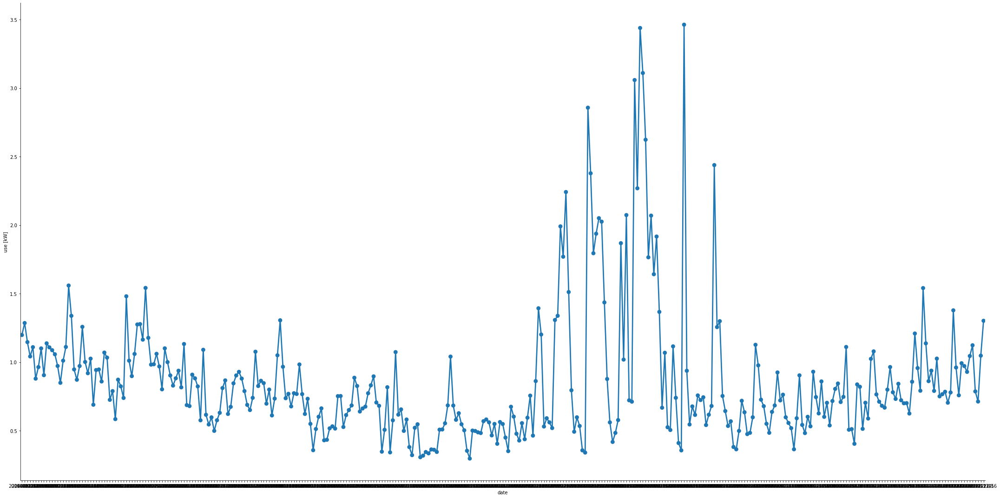

In [14]:
import seaborn as sns
# plot total usage by date
data_df['use [kW]'] = data_df['use [kW]'].astype(float)
date_wise_use = groupby_date_df.agg({'use [kW]': ['mean']}).reset_index()
date_wise_use.columns = ['date', 'use [kW]']
g = sns.catplot(x="date", y="use [kW]", kind = 'point', data=date_wise_use, height = 15, aspect = 2)

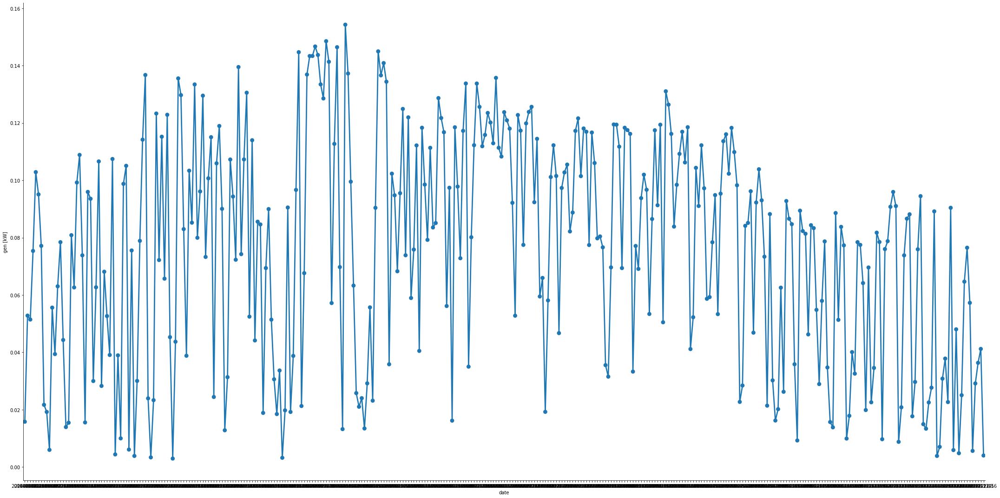

In [15]:
# plot total generation by date
data_df['gen [kW]'] = data_df['gen [kW]'].astype(float)
date_wise_gen = groupby_date_df.agg({'gen [kW]': ['mean']}).reset_index()
date_wise_gen.columns = ['date', 'gen [kW]']
g = sns.catplot(x="date", y="gen [kW]", kind = 'point', data=date_wise_gen, height = 15, aspect = 2)

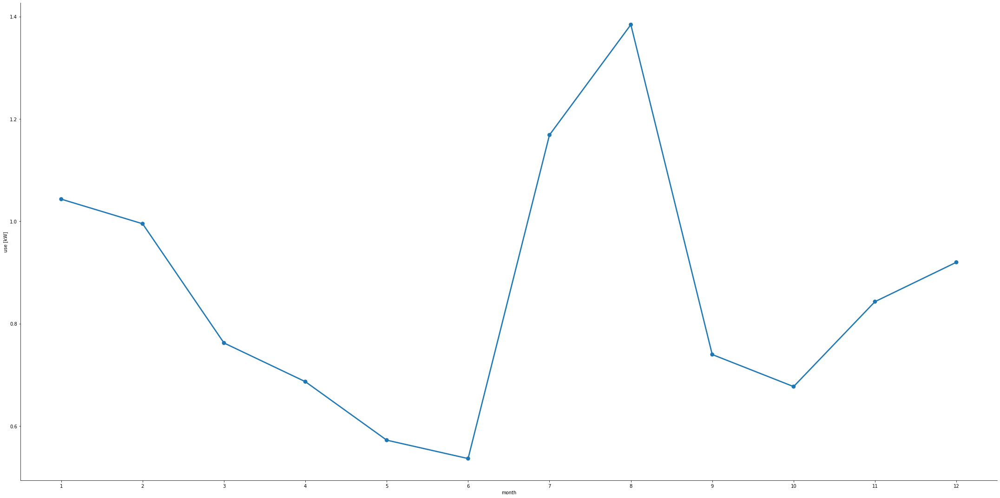

In [16]:
# plot total usage by month
month_wise_use = groupby_month_df.agg({'use [kW]': ['mean']}).reset_index()
month_wise_use.columns = ['month', 'use [kW]']
g = sns.catplot(x="month", y="use [kW]", kind = 'point', data=month_wise_use, height = 15, aspect = 2)

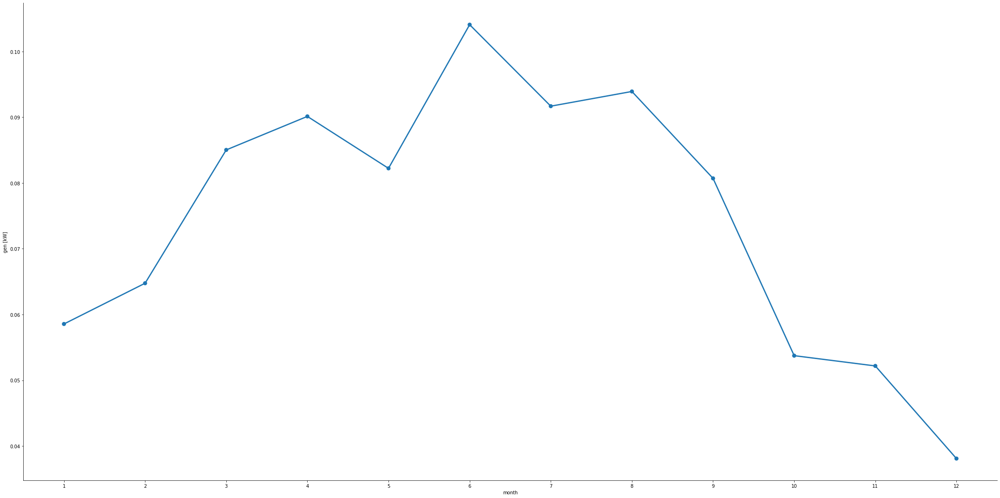

In [17]:
# plot total generation by month
month_wise_gen = groupby_month_df.agg({'gen [kW]': ['mean']}).reset_index()
month_wise_gen.columns = ['month', 'gen [kW]']
g = sns.catplot(x="month", y="gen [kW]", kind = 'point', data=month_wise_gen, height = 15, aspect = 2)

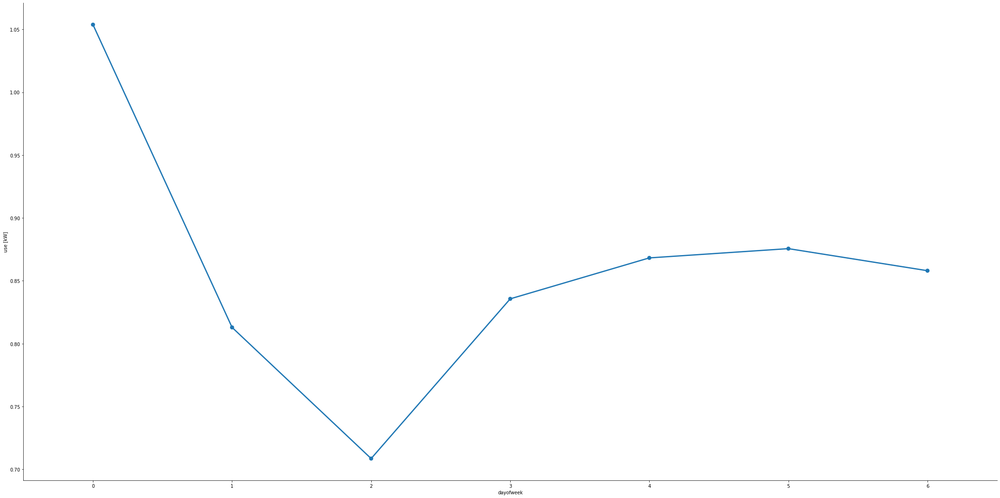

In [18]:
# plot total usage by day of week
weekday_wise_use = groupby_dayofweek_df.agg({'use [kW]': ['mean']}).reset_index()
weekday_wise_use.columns = ['dayofweek', 'use [kW]']
g = sns.catplot(x="dayofweek", y="use [kW]", kind = 'point', data=weekday_wise_use, height = 15, aspect = 2)

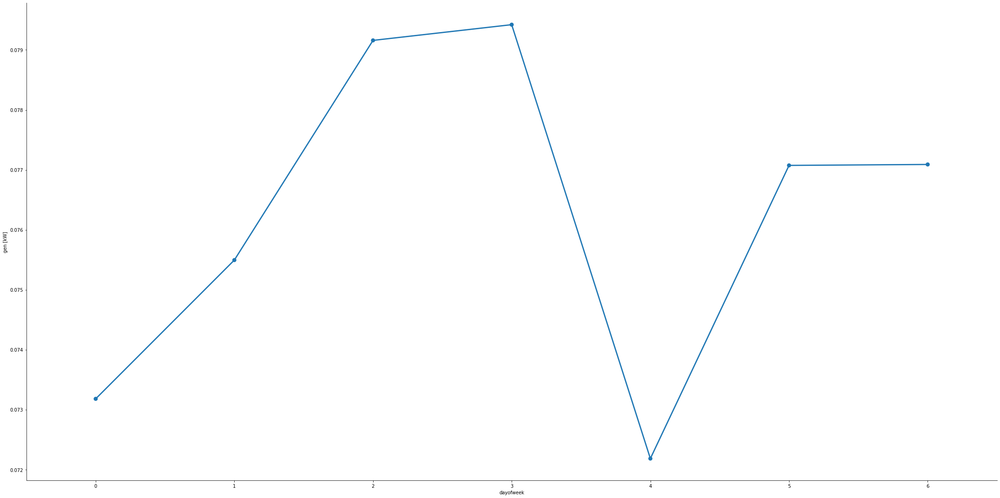

In [19]:
# plot total generation by day of week
weekday_wise_gen = groupby_dayofweek_df.agg({'gen [kW]': ['mean']}).reset_index()
weekday_wise_gen.columns = ['dayofweek', 'gen [kW]']
g = sns.catplot(x="dayofweek", y="gen [kW]", kind = 'point', data=weekday_wise_gen, height = 15, aspect = 2)

In [20]:
# Appliances to consider - pick the ones consuming most energy
# Listed in descending order of energy consumed - wine cellar, home office, fridge, furnace
# Significantly lesser energy consumed (in order of descending power) - barn, garage door, microwave

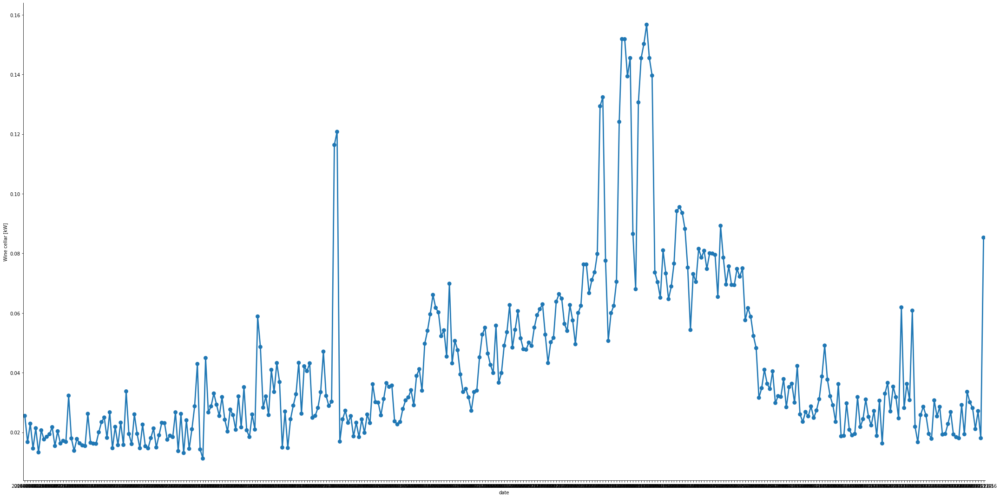

In [21]:
# plot energy consumed by wine cellar by date
date_wise_wine = groupby_date_df.agg({'Wine cellar [kW]': ['mean']}).reset_index()
date_wise_wine.columns = ['date', 'Wine cellar [kW]']
g = sns.catplot(x="date", y="Wine cellar [kW]", kind = 'point', data=date_wise_wine, height = 15, aspect = 2)

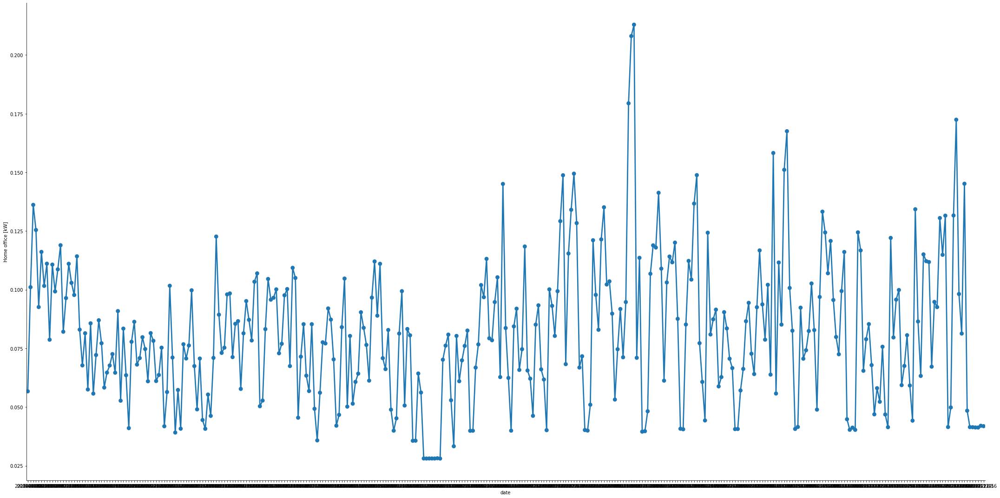

In [22]:
# plot energy consumed by home office by date
date_wise_HO = groupby_date_df.agg({'Home office [kW]': ['mean']}).reset_index()
date_wise_HO.columns = ['date', 'Home office [kW]']
g = sns.catplot(x="date", y="Home office [kW]", kind = 'point', data=date_wise_HO, height = 15, aspect = 2)

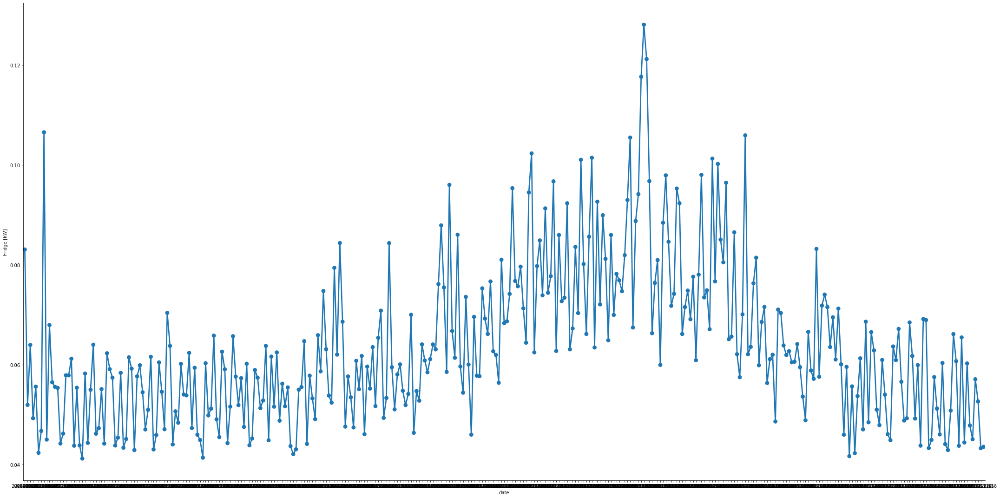

In [23]:
# plot energy consumed by fridge by date
date_wise_fridge = groupby_date_df.agg({'Fridge [kW]': ['mean']}).reset_index()
date_wise_fridge.columns = ['date', 'Fridge [kW]']
g = sns.catplot(x="date", y="Fridge [kW]", kind = 'point', data=date_wise_fridge, height = 15, aspect = 2)

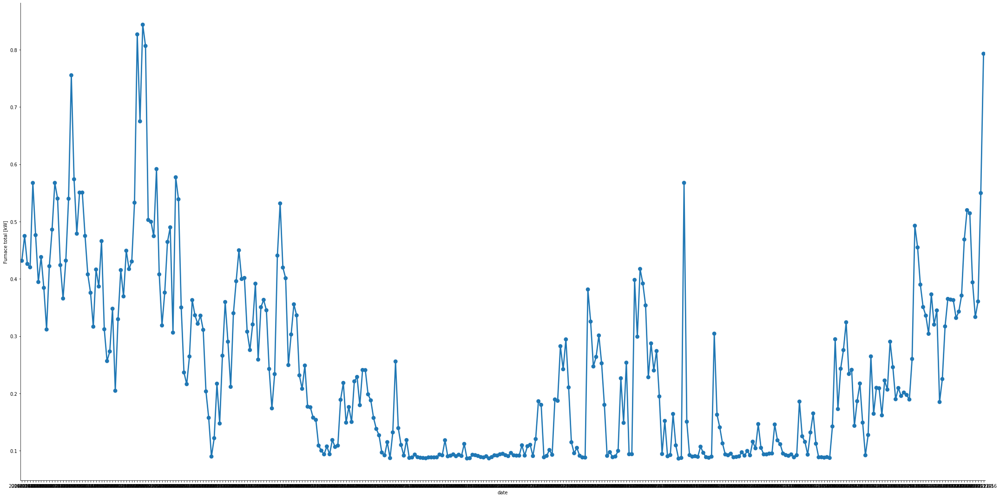

In [24]:
# plot energy consumed by furnace by date
date_wise_furnace = groupby_date_df.agg({'Furnace total [kW]': ['mean']}).reset_index()
date_wise_furnace.columns = ['date', 'Furnace total [kW]']
g = sns.catplot(x="date", y="Furnace total [kW]", kind = 'point', data=date_wise_furnace, height = 15, aspect = 2)

In [25]:
# Temporal analysis for weather attributes - temperature, apparentTemperature, humidity, windSpeed, pressure

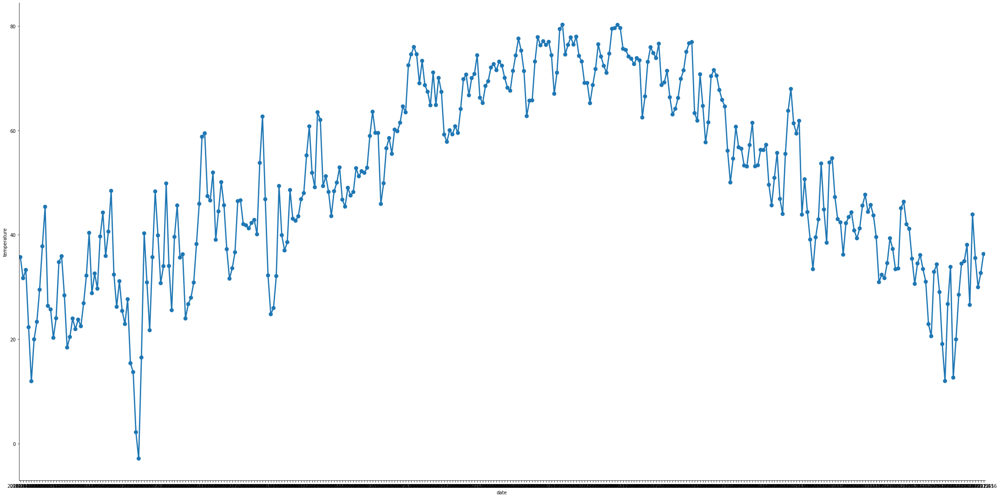

In [26]:
# plot temperature by date
date_wise_temperature = groupby_date_df.agg({'temperature': ['mean']}).reset_index()
date_wise_temperature.columns = ['date', 'temperature']
g = sns.catplot(x="date", y="temperature", kind = 'point', data=date_wise_temperature, height = 15, aspect = 2)

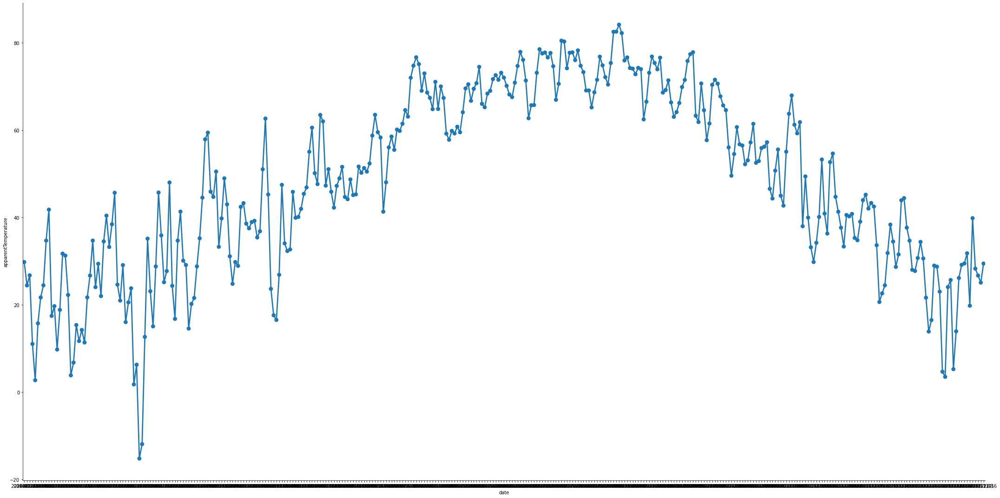

In [27]:
# plot apparent temperature by date
date_wise_apparentTemperature = groupby_date_df.agg({'apparentTemperature': ['mean']}).reset_index()
date_wise_apparentTemperature.columns = ['date', 'apparentTemperature']
g = sns.catplot(x="date", y="apparentTemperature", kind = 'point', data=date_wise_apparentTemperature, height = 15, aspect = 2)

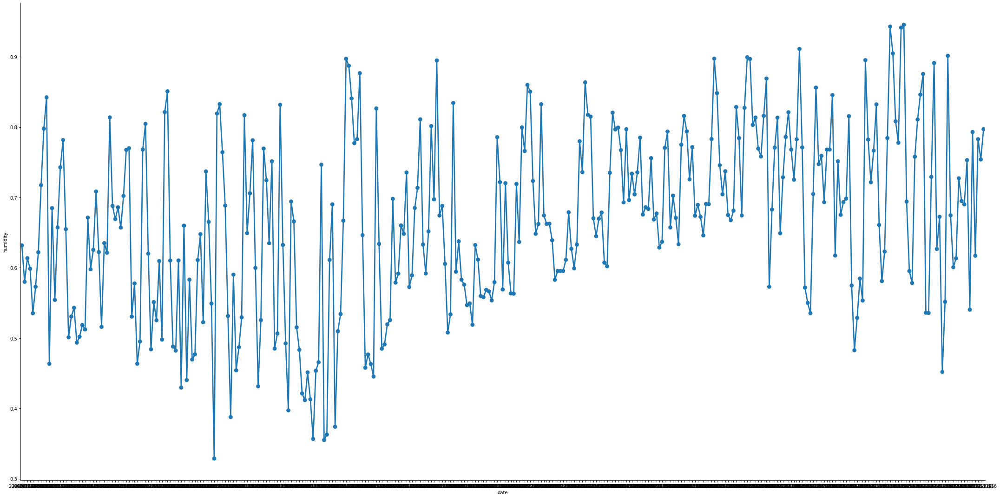

In [28]:
# plot humidity by date
date_wise_humidity = groupby_date_df.agg({'humidity': ['mean']}).reset_index()
date_wise_humidity.columns = ['date', 'humidity']
g = sns.catplot(x="date", y="humidity", kind = 'point', data=date_wise_humidity, height = 15, aspect = 2)

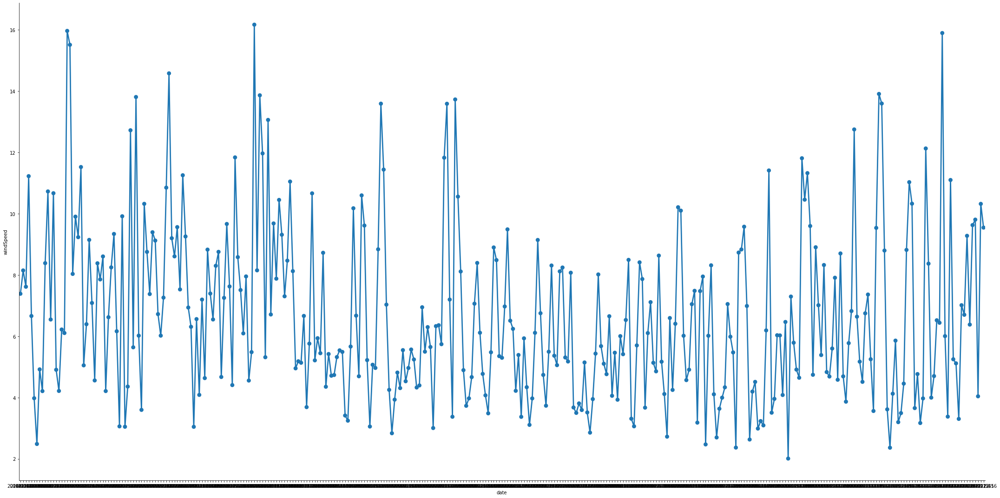

In [29]:
# plot wind speed by date
date_wise_windSpeed = groupby_date_df.agg({'windSpeed': ['mean']}).reset_index()
date_wise_windSpeed.columns = ['date', 'windSpeed']
g = sns.catplot(x="date", y="windSpeed", kind = 'point', data=date_wise_windSpeed, height = 15, aspect = 2)

In [30]:
# Performing some basic correlation analysis to get sense of relationships between attributes

In [31]:
data_df.columns

Index(['time', 'use [kW]', 'gen [kW]', 'House overall [kW]', 'Dishwasher [kW]',
       'Home office [kW]', 'Fridge [kW]', 'Wine cellar [kW]',
       'Garage door [kW]', 'Barn [kW]', 'Well [kW]', 'Microwave [kW]',
       'Living room [kW]', 'Solar [kW]', 'temperature', 'icon', 'humidity',
       'visibility', 'summary', 'apparentTemperature', 'pressure', 'windSpeed',
       'cloudCover', 'windBearing', 'precipIntensity', 'dewPoint',
       'precipProbability', 'Furnace total [kW]', 'Kitchen total [kW]', 'date',
       'month', 'dayofweek'],
      dtype='object')

In [32]:
# aggregate all columns by date
# 'House overall [kW]':['mean'],
date_wise_agg_df = groupby_date_df.agg({'use [kW]':['mean'], 'gen [kW]':['mean'], 
            'Dishwasher [kW]':['mean'],'Furnace total [kW]':['mean'],'Home office [kW]':['mean'], 'Fridge [kW]':['mean'],
       'Wine cellar [kW]':['mean'], 'Garage door [kW]':['mean'],'Kitchen total [kW]':['mean'],'Barn [kW]':['mean'], 
        'Well [kW]':['mean'],
       'Microwave [kW]':['mean'], 'Living room [kW]':['mean'], 'Solar [kW]':['mean'], 'temperature':['mean'],
                                        'humidity':['mean'], 'visibility':['mean'],'apparentTemperature':['mean'],
        'pressure':['mean'], 'windSpeed':['mean'], 'cloudCover':['mean'], 'windBearing':['mean'], 
            'precipIntensity':['mean'],'dewPoint':['mean'], 'precipProbability':['mean'],
        }).reset_index()
date_wise_agg_df.columns = ['date', 'use [kW]', 'gen [kW]', 'Dishwasher [kW]',
                                        'Furnace total [kW]','Home office [kW]', 'Fridge [kW]',
       'Wine cellar [kW]', 'Garage door [kW]','Kitchen total [kW]','Barn [kW]', 'Well [kW]',
       'Microwave [kW]', 'Living room [kW]', 'Solar [kW]', 'temperature','humidity', 'visibility','apparentTemperature',
        'pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity','dewPoint', 'precipProbability']
subset_df = date_wise_agg_df.drop(columns=['date'])

In [33]:
subset_df

,use [kW],gen [kW],Dishwasher [kW],Furnace total [kW],Home office [kW],Fridge [kW],Wine cellar [kW],Garage door [kW],Kitchen total [kW],Barn [kW],...,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
0,1.198482,0.015812,0.052208,0.431597,0.056727,0.083106,0.025520,0.013358,0.010193,0.087389,...,0.631825,9.759298,29.815211,1014.740316,7.386772,0.669456,263.689474,0.000112,24.429175,0.002035
1,1.285779,0.052813,0.043857,0.474835,0.101090,0.051980,0.016734,0.013366,0.010739,0.129012,...,0.580056,9.953722,24.462806,1014.510944,8.148319,0.235000,264.529167,0.000000,18.498597,0.000000
2,1.146617,0.051445,0.073270,0.426132,0.136156,0.063992,0.022909,0.013503,0.013258,0.101732,...,0.613597,10.000000,26.769736,1009.626375,7.616264,0.185472,227.120833,0.000000,21.252958,0.000000
3,1.042143,0.075365,0.040889,0.420229,0.125452,0.049317,0.014570,0.013368,0.012046,0.033220,...,0.598597,9.805056,11.067278,1016.432236,11.226181,0.151875,319.797222,0.000000,10.302708,0.000000
4,1.109701,0.102852,0.050676,0.567406,0.092612,0.055650,0.021384,0.013731,0.010246,0.034838,...,0.535292,9.996375,2.759708,1034.091292,6.661236,0.010944,291.412500,0.000000,-2.286222,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346,1.123497,0.005646,0.000075,0.393946,0.041442,0.045108,0.028141,0.015606,0.007413,0.032944,...,0.792965,8.139528,39.860250,1015.268514,9.628493,0.622403,213.577083,0.001077,37.586049,0.035625
347,0.787089,0.029160,0.048937,0.333515,0.041327,0.057129,0.021090,0.013300,0.007130,0.033755,...,0.617097,9.892333,28.305771,1014.644944,9.807250,0.298854,298.526389,0.000000,23.695014,0.000000
348,0.713090,0.036347,0.000066,0.360619,0.041296,0.052677,0.027129,0.014757,0.003982,0.033839,...,0.782819,7.431125,26.725819,1013.819625,4.039736,0.382917,171.723611,0.009142,23.834139,0.187951
349,1.047685,0.041201,0.050760,0.549696,0.042049,0.043310,0.018033,0.013039,0.004137,0.031623,...,0.753951,8.815250,25.109743,999.368792,10.321722,0.170583,264.139583,0.001153,25.579729,0.046319


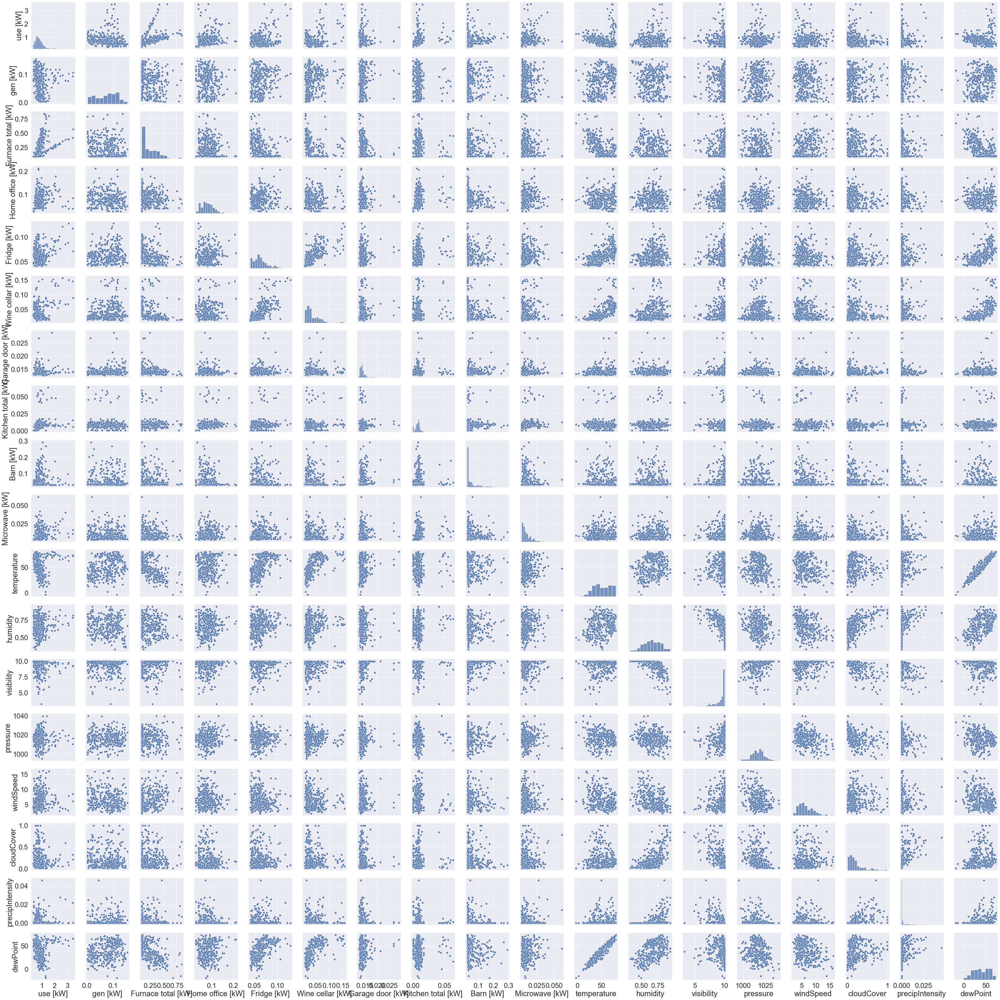

In [34]:
df_cols = ['use [kW]', 'gen [kW]', 'Furnace total [kW]','Home office [kW]', 'Fridge [kW]',
       'Wine cellar [kW]', 'Garage door [kW]','Kitchen total [kW]','Barn [kW]','Microwave [kW]',
'temperature','humidity', 'visibility','pressure','windSpeed', 'cloudCover','precipIntensity','dewPoint']
sns.set(font_scale = 2)
sns.pairplot(subset_df, vars=df_cols)

In [35]:
subset_df.shape

(351, 25)

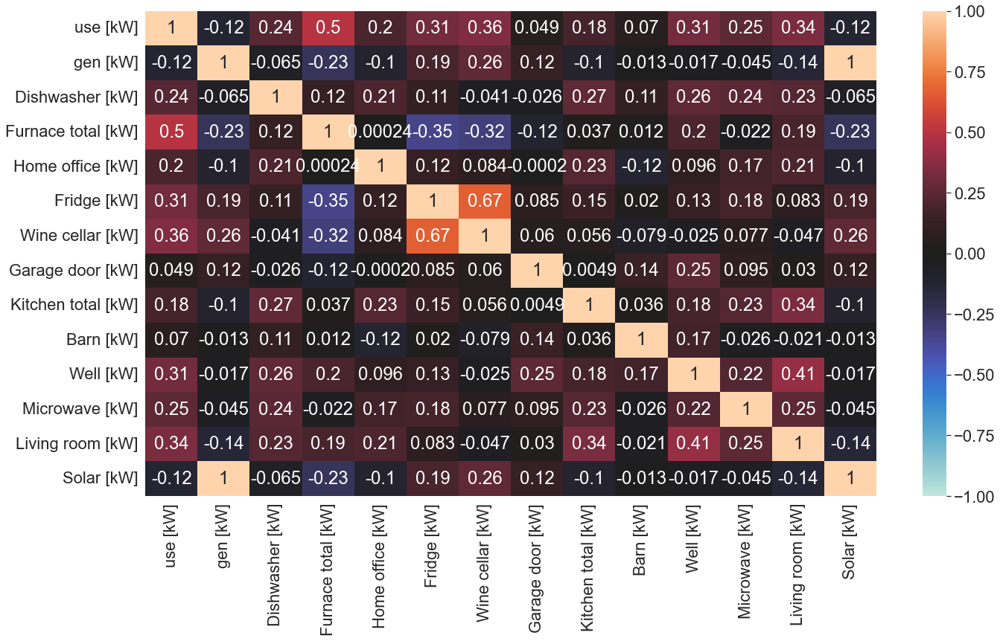

In [36]:
f,ax = plt.subplots(figsize=(22, 12))
appliance_df = subset_df.drop(columns=['temperature','humidity', 'visibility','apparentTemperature',
        'pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity','dewPoint', 'precipProbability'])
corr_appliance = appliance_df.corr()
sns.heatmap(corr_appliance, annot=True, vmin=-1.0, vmax=1.0, center=0)
plt.show()

<AxesSubplot:>

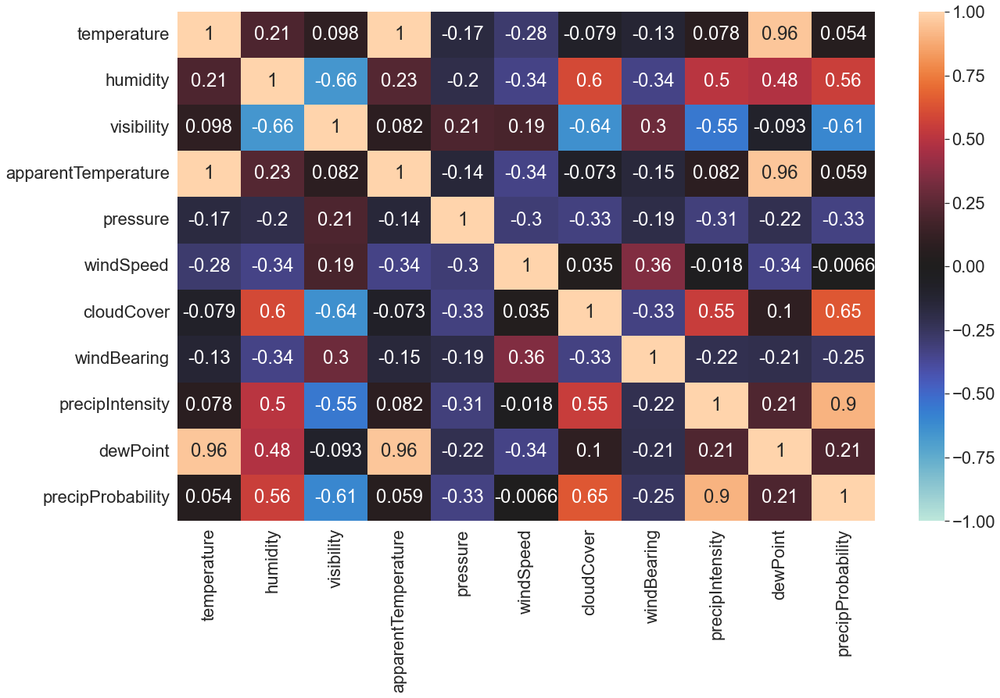

In [37]:
f,ax = plt.subplots(figsize=(20, 12))
weather_df = subset_df.filter(items=['temperature','humidity', 'visibility','apparentTemperature',
        'pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity','dewPoint', 'precipProbability'])
corr_weather = weather_df.corr()
sns.heatmap(corr_weather, annot=True, vmin=-1.0, vmax=1.0, center=0)

<AxesSubplot:>

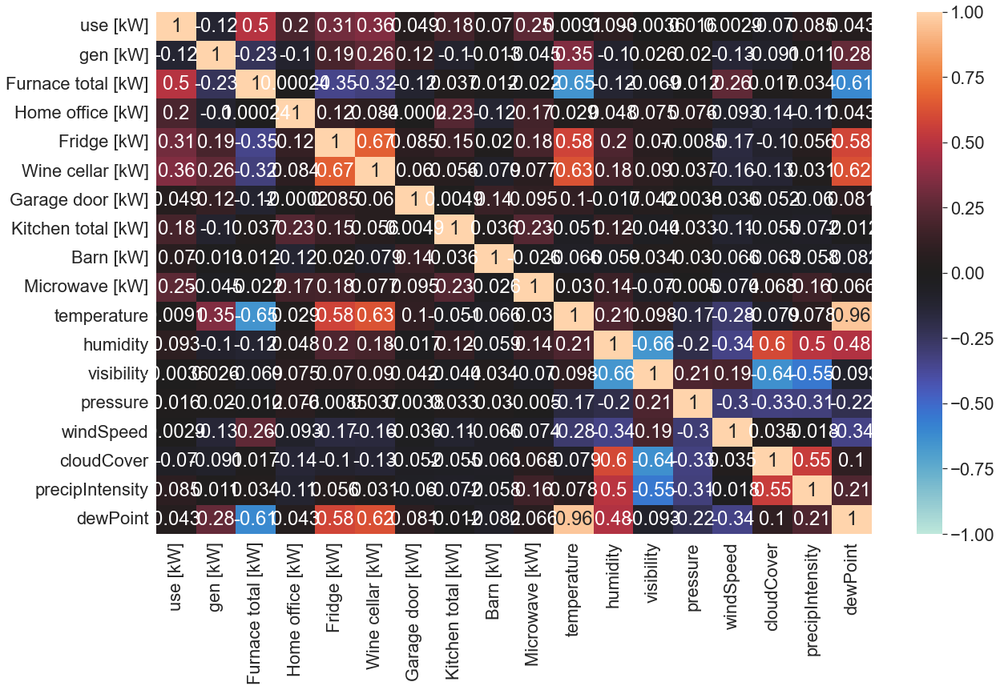

In [38]:
f,ax = plt.subplots(figsize=(20, 12))
df_cols = ['use [kW]', 'gen [kW]', 'Furnace total [kW]','Home office [kW]', 'Fridge [kW]',
       'Wine cellar [kW]', 'Garage door [kW]','Kitchen total [kW]','Barn [kW]','Microwave [kW]',
'temperature','humidity', 'visibility','pressure','windSpeed', 'cloudCover','precipIntensity','dewPoint']
corr_mix = subset_df[df_cols].corr()
sns.heatmap(corr_mix, annot=True, vmin=-1.0, vmax=1.0, center=0)

## Relationships between attributes from covariance heatmaps :

Wine cellar and temperature, and wine cellar and dew point seem to have a positive correlation. <br>
Furnace and temperature, and furnace and dew point seem to have a negative correlation.

## Modeling

In [39]:
data_df = data_df.set_index(data_df['time'])
# resampling/aggregating the dataframe - by hourly intervals and by daily intervals
small_df = data_df.resample('H').mean()
daily_df = data_df.resample('24H').mean()
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

### Predicting hourly energy consumption

In [40]:
df = data_df

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
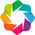

In [41]:
import holoviews as hv
from holoviews import opts
hv.extension('bokeh')

In [42]:
from statsmodels.tsa.api import VAR
from sklearn.metrics import mean_absolute_error

var_df = df.resample('H').mean()
def var_train(cols=['temperature', 'humidity', 'visibility',  'pressure', 'windSpeed',  'dewPoint', 'use [kW]'], max_order=10, train_ratio=0.9,test_ratio=0.1):
    tr,te = [int(len(var_df) * i) for i in [train_ratio, test_ratio]]
    train, test = var_df[0:tr], var_df[tr:]
    var_func = VAR(train[cols], freq='H')
    var_func.select_order(max_order)
    model = var_func.fit(maxlags=max_order, ic='aic', trend='ct')
    model_result = model.summary()
    varForecast_df = pd.DataFrame(model.forecast(model.endog, steps=len(test)),columns=cols)
    varForecast_df.index = test.index
    
    return varForecast_df, model_result

In [43]:
varForecast_df, model_result = var_train(cols=['temperature', 'humidity','windSpeed', 'cloudCover', 'windBearing', 'dewPoint','use [kW]'], \
                                         max_order=48, train_ratio=0.99,test_ratio=0.01)
#evaluation with MAE
var_use_mae = mean_absolute_error(var_df['use [kW]'][-len(varForecast_df):], varForecast_df['use [kW]'])
((hv.Curve(var_df['use [kW]'], label='use [kW]').opts(color='blue')\
  * hv.Curve(varForecast_df['use [kW]'], label='use predicted').opts(color='red', title='VAR Result - Total Energy Consumption')).opts(legend_position='bottom') + \
 (hv.Curve(var_df['use [kW]'][-int(len(var_df)*0.05):], label='use').opts(color='blue') \
  * hv.Curve(varForecast_df['use [kW]'], label='use predicted').opts(color='red', title='VAR Result Enlarged - Total Energy Consumption')).opts(legend_position='bottom'))\
    .opts(opts.Curve(xlabel="Time", yformatter='%.2fkw', width=800, height=300, show_grid=True, tools=['hover'])).opts(shared_axes=False).cols(1)

:Layout
   .Overlay.I  :Overlay
      .Curve.Use_left_square_bracket_kW_right_square_bracket :Curve   [time]   (use [kW])
      .Curve.Use_predicted                                   :Curve   [time]   (use [kW])
   .Overlay.II :Overlay
      .Curve.Use           :Curve   [time]   (use [kW])
      .Curve.Use_predicted :Curve   [time]   (use [kW])

### Prophet

In [46]:
from fbprophet import Prophet

def prophet_build_and_predict(train_size, base_df, regressor=False):
    prophet_df = pd.DataFrame()
    use_df = base_df[['use [kW]', 'temperature']]
    prophet_df["ds"] = use_df.index
    prophet_df['y'] = use_df['use [kW]'].values
    prophet_df['temperature'] = use_df['temperature'].values
    #train_size=0.7
    train_index = int(train_size * len(prophet_df))
    train = prophet_df[0:train_index]
    test = prophet_df[train_index:]
    model = Prophet()
    if regressor:
        model.add_regressor('temperature')
    # fit the model
    model.fit(train)
    
    # predict training data - check training error
    future = pd.DataFrame()
    future['ds']= train['ds'].values
    if regressor:
        future['temperature'] = train['temperature'].values
    forecast = model.predict(future)
    print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())
    model.plot(forecast)
    plt.show()

    # plot predicted (training data) and actual values
    forecast_df = pd.DataFrame()
    forecast_df['use [kW]'] = forecast.yhat
    forecast_df.index = forecast.ds
    test_df = pd.DataFrame()
    test_df['use [kW]'] = train.y
    test_df.index = train.ds
    plt.figure(figsize=(12,5))
    plt.ylabel('use [kW]')
    ax1 = test_df['use [kW]'].plot(color='blue', grid=True, label='Actual')
    ax2 = forecast_df['use [kW]'].plot(color='red', grid=True, secondary_y=True, label='Predicted - training')
    ax1.legend(loc=1)
    ax2.legend(loc=2)
    plt.show()

    # calculate prediction error
    y_true = test_df['use [kW]'].values
    y_pred = forecast_df['use [kW]'].values
    mae = mean_absolute_error(y_true, y_pred)
    print('MAE for training set : %.3f' % mae)
    print('MAPE for training set : ',mean_absolute_percentage_error(y_true, y_pred))
    
    # do prediction on test set
    future = pd.DataFrame()
    future['ds']= test['ds'].values
    if regressor:
        future['temperature'] = test['temperature'].values
    forecast = model.predict(future)
    print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())
    model.plot(forecast)
    plt.show()

    # plot predicted and actual values
    forecast_df = pd.DataFrame()
    forecast_df['use [kW]'] = forecast.yhat
    forecast_df.index = forecast.ds
    test_df = pd.DataFrame()
    test_df['use [kW]'] = test.y
    test_df.index = test.ds
    plt.figure(figsize=(12,5))
    plt.ylabel('use [kW]')
    ax1 = test_df['use [kW]'].plot(color='blue', grid=True, label='Actual')
    ax2 = forecast_df['use [kW]'].plot(color='red', grid=True, secondary_y=True, label='Predicted')
    ax1.legend(loc=1)
    ax2.legend(loc=2)
    plt.show()

    # calculate prediction error
    y_true = test_df['use [kW]'].values
    y_pred = forecast_df['use [kW]'].values
    mae = mean_absolute_error(y_true, y_pred)
    print('MAE for test set : %.3f' % mae)
    print('MAPE for test set : ',mean_absolute_percentage_error(y_true, y_pred))

#### Prophet - using 90% of data as training set

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


                   ds      yhat  yhat_lower  yhat_upper
0 2016-01-01 05:00:00  0.916069   -0.074001    1.821474
1 2016-01-01 06:00:00  0.814268   -0.115117    1.737159
2 2016-01-01 07:00:00  0.784598   -0.165431    1.749459
3 2016-01-01 08:00:00  0.826555   -0.082752    1.745076
4 2016-01-01 09:00:00  0.911912   -0.009128    1.803161


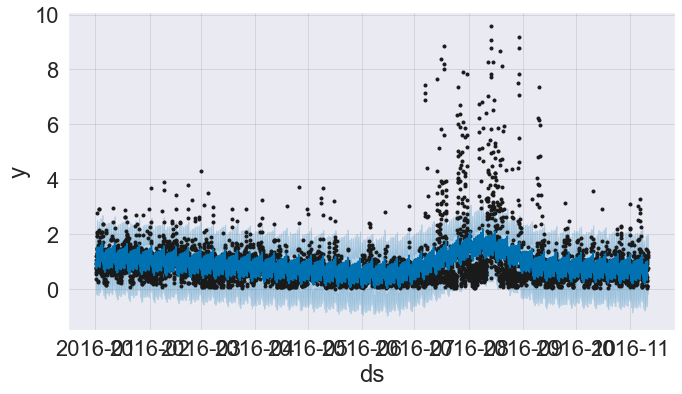

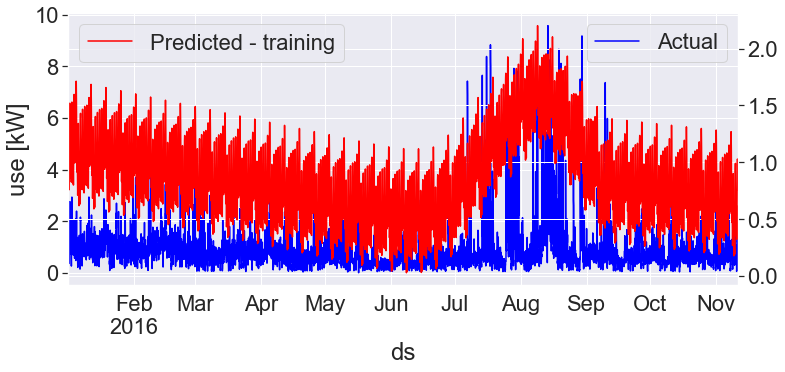

MAE for training set : 0.419
MAPE for training set :  0.9027485879466477
                   ds      yhat  yhat_lower  yhat_upper
0 2016-11-11 04:00:00  0.598867   -0.415041    1.543727
1 2016-11-11 05:00:00  0.450771   -0.497602    1.370893
2 2016-11-11 06:00:00  0.349051   -0.557376    1.299880
3 2016-11-11 07:00:00  0.319463   -0.560459    1.292175
4 2016-11-11 08:00:00  0.361502   -0.564852    1.395677


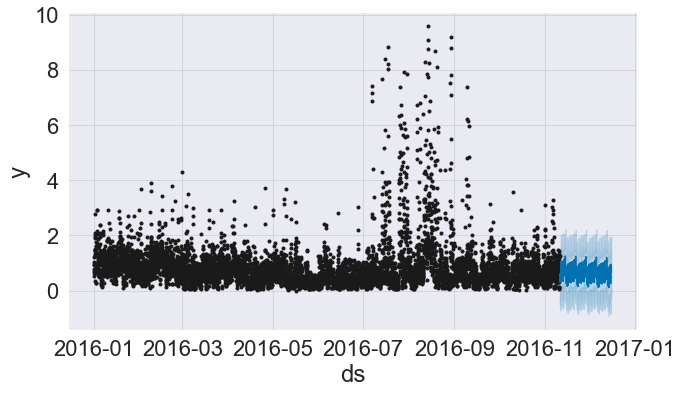

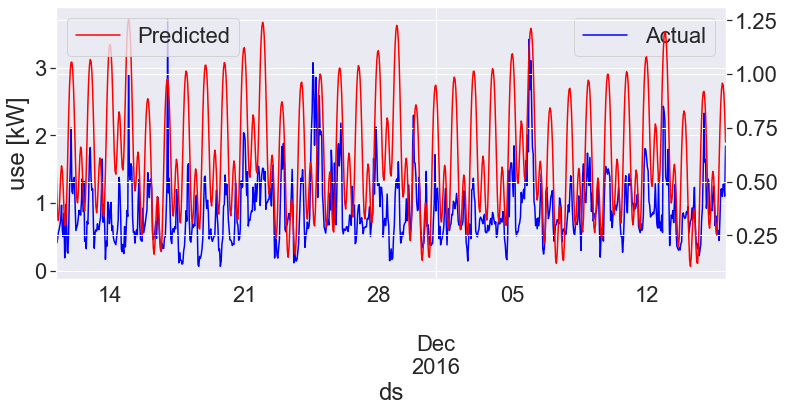

MAE for test set : 0.367
MAPE for test set :  0.4392307349936734


In [47]:
prophet_build_and_predict(0.9, small_df)

#### Prophet - using 99% of data as training set

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


                   ds      yhat  yhat_lower  yhat_upper
0 2016-01-01 05:00:00  0.916972    0.039697    1.808231
1 2016-01-01 06:00:00  0.819833   -0.088638    1.763690
2 2016-01-01 07:00:00  0.791006   -0.149105    1.731223
3 2016-01-01 08:00:00  0.831023   -0.127790    1.769195
4 2016-01-01 09:00:00  0.915699   -0.015992    1.823131


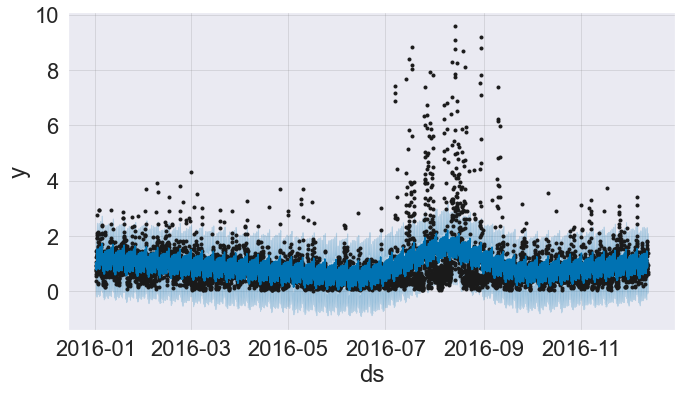

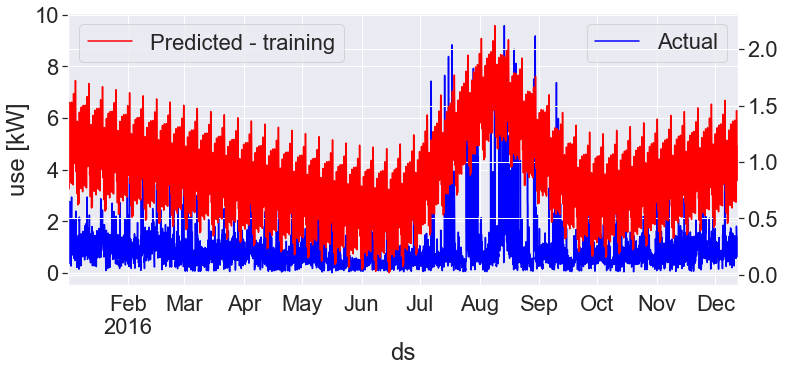

MAE for training set : 0.406
MAPE for training set :  0.859869403139503
                   ds      yhat  yhat_lower  yhat_upper
0 2016-12-12 16:00:00  0.864553   -0.042649    1.733127
1 2016-12-12 17:00:00  0.925330    0.044884    1.850547
2 2016-12-12 18:00:00  1.048236    0.085001    1.995134
3 2016-12-12 19:00:00  1.200813    0.275208    2.037042
4 2016-12-12 20:00:00  1.348400    0.408819    2.210985


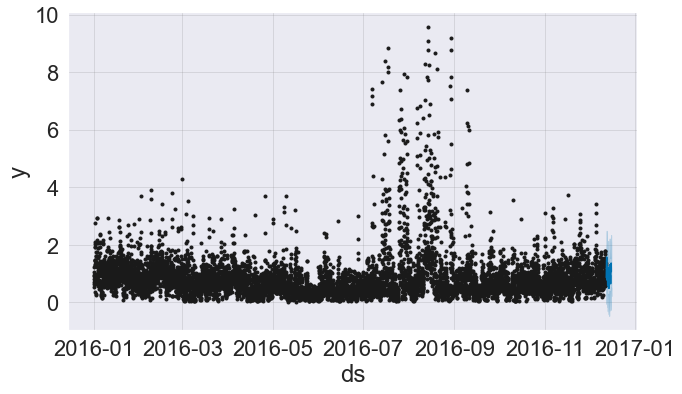

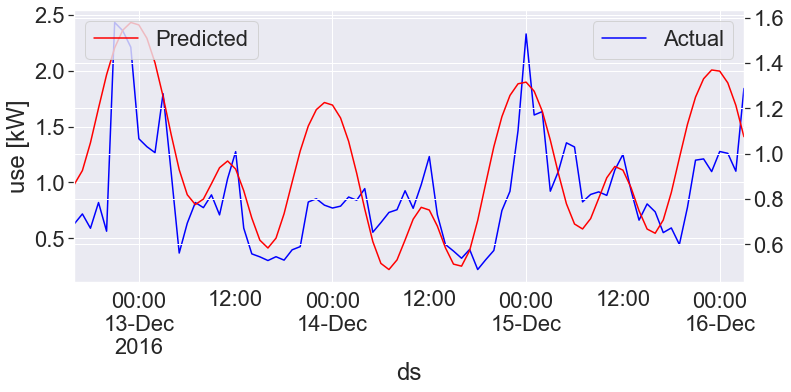

MAE for test set : 0.293
MAPE for test set :  0.425399326713728


In [48]:
prophet_build_and_predict(0.99, small_df)

#### Prophet - using 70% of data as training set

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


                   ds      yhat  yhat_lower  yhat_upper
0 2016-01-01 05:00:00  0.911201   -0.064689    1.893896
1 2016-01-01 06:00:00  0.806029   -0.201926    1.768011
2 2016-01-01 07:00:00  0.772305   -0.226772    1.682147
3 2016-01-01 08:00:00  0.810807   -0.219582    1.840549
4 2016-01-01 09:00:00  0.893623   -0.121732    1.860579


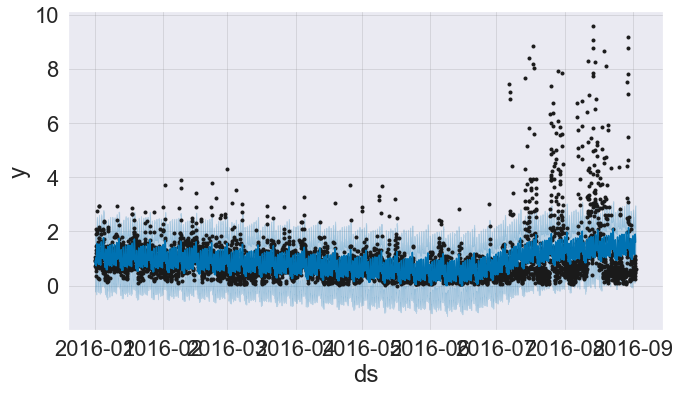

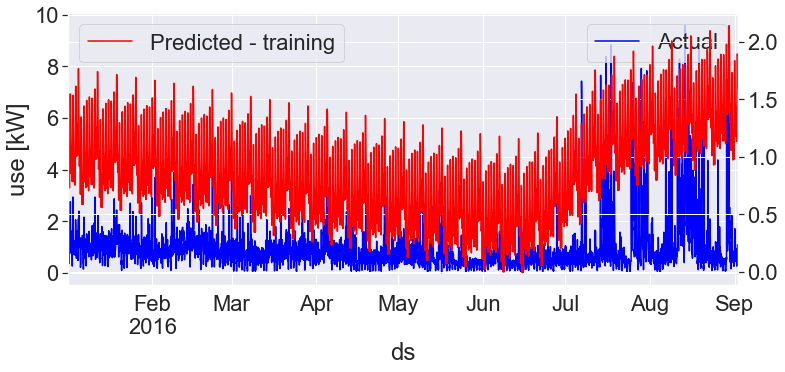

MAE for training set : 0.455
MAPE for training set :  1.0007075036937332
                   ds      yhat  yhat_lower  yhat_upper
0 2016-09-02 04:00:00  1.442579    0.487201    2.483899
1 2016-09-02 05:00:00  1.293327    0.329655    2.354081
2 2016-09-02 06:00:00  1.188571    0.161802    2.204827
3 2016-09-02 07:00:00  1.155262    0.174256    2.212898
4 2016-09-02 08:00:00  1.194181    0.175111    2.258025


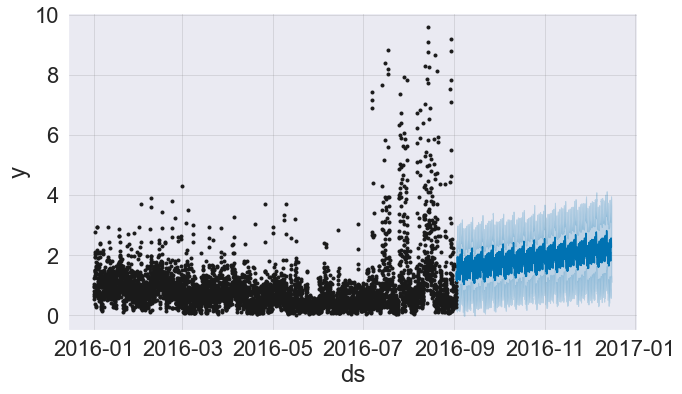

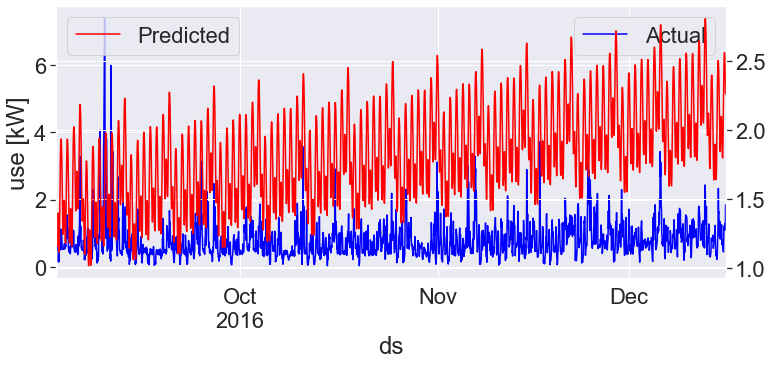

MAE for test set : 1.093
MAPE for test set :  2.4117753549143064


In [49]:
prophet_build_and_predict(0.7, small_df)

#### Prophet - adding temperature attribute as a regressor

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


                   ds      yhat  yhat_lower  yhat_upper
0 2016-11-11 04:00:00  0.613056   -0.341016    1.585740
1 2016-11-11 05:00:00  0.464137   -0.446298    1.373402
2 2016-11-11 06:00:00  0.361892   -0.571029    1.265388
3 2016-11-11 07:00:00  0.331866   -0.552226    1.314612
4 2016-11-11 08:00:00  0.372246   -0.562688    1.274391


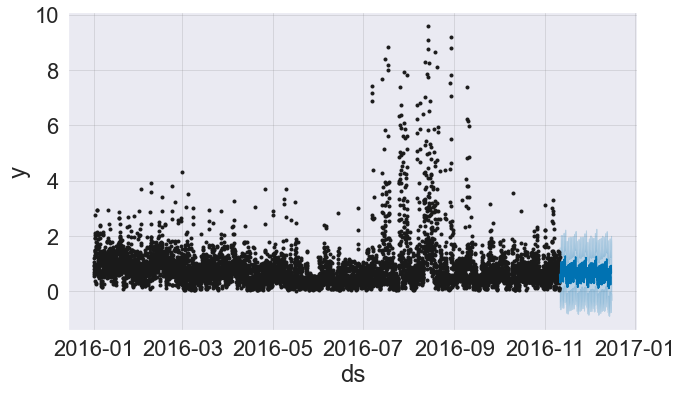

In [50]:
use_df = small_df[['use [kW]', 'temperature']]
prophet_df = pd.DataFrame()
prophet_df["ds"] = use_df.index
prophet_df['y'] = use_df['use [kW]'].values
prophet_df['temperature'] = use_df['temperature'].values
prophet_df
train_size=0.9
train_index = int(train_size * len(prophet_df))
train = prophet_df[0:train_index]
test = prophet_df[train_index:]
model = Prophet()
model.add_regressor('temperature')
model.fit(train)

# do the prediction
future = pd.DataFrame()
future['ds']= test['ds'].values
future['temperature'] = test['temperature'].values
forecast = model.predict(future)
print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head())
# plot forecast
model.plot(forecast)
plt.show()

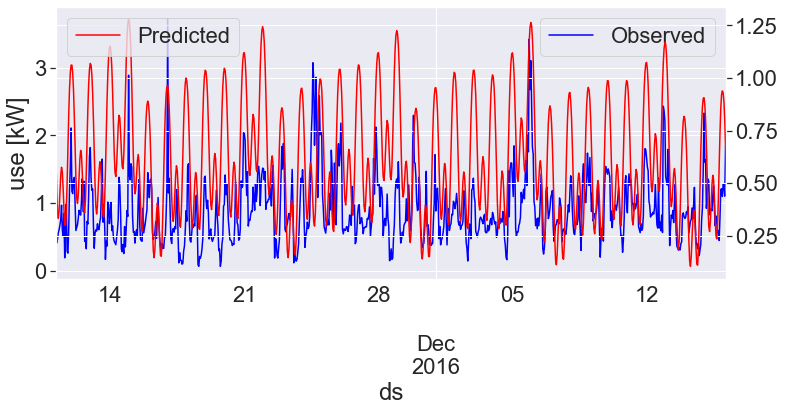

MAE: 0.366
MAPE:  0.4376995852021921


In [51]:
forecast_df = pd.DataFrame()
forecast_df['use [kW]'] = forecast.yhat
forecast_df.index = forecast.ds
test_df = pd.DataFrame()
test_df['use [kW]'] = test.y
test_df.index = test.ds

plt.figure(figsize=(12,5))
plt.xlabel('Date')
plt.ylabel('use [kW]')

ax1 = test_df['use [kW]'].plot(color='blue', grid=True, label='Observed')
ax2 = forecast_df['use [kW]'].plot(color='red', grid=True, secondary_y=True, label='Predicted')
ax1.legend(loc=1)
ax2.legend(loc=2)
plt.show()

# calculate prediction error
y_true = test_df['use [kW]'].values
y_pred = forecast_df['use [kW]'].values
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)
print('MAPE: ',mean_absolute_percentage_error(y_true, y_pred))

### There doesn't seem to be much of a difference in prediction results by adding temperature as regressor.

### XGBoost

In [52]:
from xgboost import XGBRegressor

# transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    #print(df.shape)
    cols = list()
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    #print('shift 1')
    #print(cols)
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    #print('shift 2')
    #print(cols)
    # put it all together
    agg = pd.concat(cols, axis=1)
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

def timeseries_train_test_split(X, y, test_size):
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    X_train = X[:test_index]
    y_train = y[:test_index]
    X_test = X[test_index:]
    y_test = y[test_index:]
    return X_train, X_test, y_train, y_test

# Returns two sets of training and validation sets from the training data passed - splits the training data into a 
# training set and a validation set. Splitting is done twice to produce 2 different splits (different traning and 
# validation sets) each time.
def cross_val_split(X, y, n_split=2, test_size=0.25):
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    # split 1
    X_train = X[:test_index]
    y_train = y[:test_index]
    X_test = X[test_index:]
    y_test = y[test_index:]
    # split 2
    X_train2 = X[-(test_index+1):]
    y_train2 = y[-(test_index+1):]
    X_test2 = X[:-(test_index+1)]
    y_test2 = y[:-(test_index+1)]
    print('Cross val split 1 train size: ',len(X_train))
    print('Cross val split 2 train size: ',len(X_train2))
    split_list = []
    split_list.append([X_train, X_test, y_train, y_test])
    split_list.append([X_train2, X_test2, y_train2, y_test2])
    return split_list

In [53]:
series = pd.DataFrame(small_df['use [kW]'].copy())
values = series.values
#values
data = series_to_supervised(values, n_in=12)

In [54]:
print(data)

[[1.04412972 0.91816694 0.71473611 ... 1.47058056 1.32163639 1.91668861]
 [0.91816694 0.71473611 0.96001278 ... 1.32163639 1.91668861 2.09538972]
 [0.71473611 0.96001278 0.63983639 ... 1.91668861 2.09538972 1.30432333]
 ...
 [0.93049028 0.66233833 0.80742333 ... 1.09699861 1.27658472 1.26023056]
 [0.66233833 0.80742333 0.73678972 ... 1.27658472 1.26023056 1.1003575 ]
 [0.80742333 0.73678972 0.55093639 ... 1.26023056 1.1003575  1.84041333]]


In [55]:
data.shape

(8387, 13)

In [56]:
data[0]

array([1.04412972, 0.91816694, 0.71473611, 0.96001278, 0.63983639,
       1.21941611, 0.79874722, 0.53705472, 0.35837667, 0.75672028,
       1.47058056, 1.32163639, 1.91668861])

In [57]:
data[1]

array([0.91816694, 0.71473611, 0.96001278, 0.63983639, 1.21941611,
       0.79874722, 0.53705472, 0.35837667, 0.75672028, 1.47058056,
       1.32163639, 1.91668861, 2.09538972])

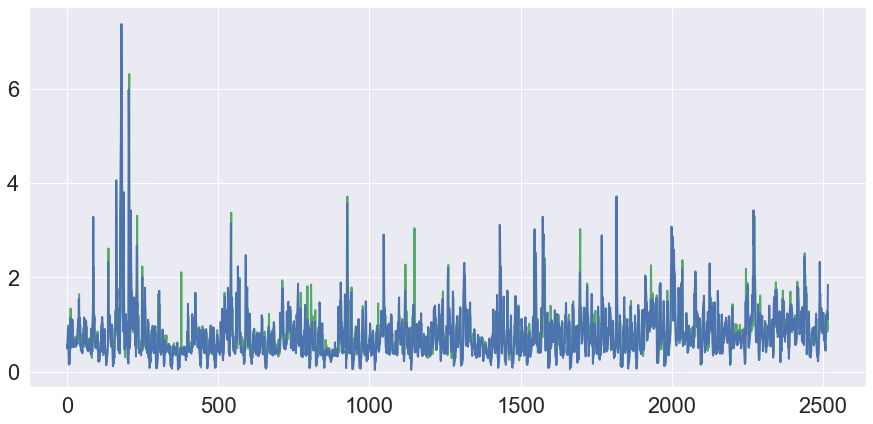

MAE: 0.248
MAPE :  0.41499647535984713


In [58]:
X, y = data[:, :-1], data[:, -1]
# Test prediction accuracy for 70-30 split
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)
#model = XGBRegressor(n_estimators=1000, learning_rate=0.1)
model = XGBRegressor(n_estimators=1000, learning_rate=0.05)
model.fit(X_train, y_train)
prediction = model.predict(X_test)
plt.figure(figsize=(15, 7))
plt.plot(prediction, "g", label="prediction", linewidth=2.0)
plt.plot(y_test, label="actual", linewidth=2.0)
plt.show()

mae = mean_absolute_error(y_test, prediction)
print('MAE: %.3f' % mae)
mape = mean_absolute_percentage_error(y_test, prediction)
print('MAPE : ',mape)

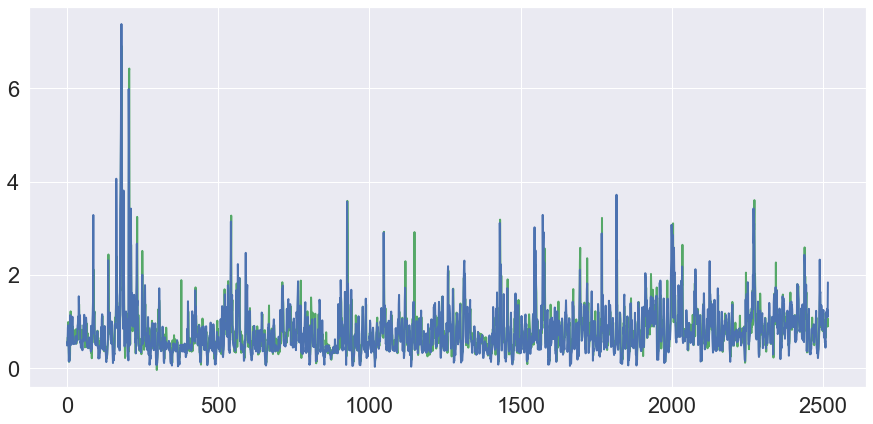

MAE: 0.250
MAPE :  0.4128075990596992


In [59]:
model = XGBRegressor(n_estimators=1000, learning_rate=0.1)
model.fit(X_train, y_train);
prediction = model.predict(X_test)
plt.figure(figsize=(15, 7))
plt.plot(prediction, "g", label="prediction", linewidth=2.0)
plt.plot(y_test, label="actual", linewidth=2.0)
plt.show()

mae = mean_absolute_error(y_test, prediction)
print('MAE: %.3f' % mae)
mape = mean_absolute_percentage_error(y_test, prediction)
print('MAPE : ',mape)

### Try predicting daily energy consumption instead of hourly
Prediction of hourly energy consumption is giving poor results for both Prophet and XGBoost - MAPE is quite high. Hence, trying prediction of daily energy consumption.

In [60]:
daily_df

,use [kW],gen [kW],House overall [kW],Dishwasher [kW],Home office [kW],Fridge [kW],Wine cellar [kW],Garage door [kW],Barn [kW],Well [kW],...,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace total [kW],Kitchen total [kW],month,dayofweek
time,,,,,,,,,,,,,,,,,,,,,
2016-01-01,1.198482,0.015812,1.198482,0.052208,0.056727,0.083106,0.025520,0.013358,0.087389,0.026787,...,7.386772,0.669456,263.689474,0.000112,24.429175,0.002035,0.431597,0.010193,1,4
2016-01-02,1.285779,0.052813,1.285779,0.043857,0.101090,0.051980,0.016734,0.013366,0.129012,0.023395,...,8.148319,0.235000,264.529167,0.000000,18.498597,0.000000,0.474835,0.010739,1,5
2016-01-03,1.146617,0.051445,1.146617,0.073270,0.136156,0.063992,0.022909,0.013503,0.101732,0.022191,...,7.616264,0.185472,227.120833,0.000000,21.252958,0.000000,0.426132,0.013258,1,6
2016-01-04,1.042143,0.075365,1.042143,0.040889,0.125452,0.049317,0.014570,0.013368,0.033220,0.030166,...,11.226181,0.151875,319.797222,0.000000,10.302708,0.000000,0.420229,0.012046,1,0
2016-01-05,1.109701,0.102852,1.109701,0.050676,0.092612,0.055650,0.021384,0.013731,0.034838,0.013304,...,6.661236,0.010944,291.412500,0.000000,-2.286222,0.000000,0.567406,0.010246,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-12,1.123497,0.005646,1.123497,0.000075,0.041442,0.045108,0.028141,0.015606,0.032944,0.011743,...,9.628493,0.622403,213.577083,0.001077,37.586049,0.035625,0.393946,0.007413,12,0
2016-12-13,0.787089,0.029160,0.787089,0.048937,0.041327,0.057129,0.021090,0.013300,0.033755,0.011654,...,9.807250,0.298854,298.526389,0.000000,23.695014,0.000000,0.333515,0.007130,12,1
2016-12-14,0.713090,0.036347,0.713090,0.000066,0.041296,0.052677,0.027129,0.014757,0.033839,0.006161,...,4.039736,0.382917,171.723611,0.009142,23.834139,0.187951,0.360619,0.003982,12,2


In [61]:
series = pd.DataFrame(daily_df['use [kW]'].copy())
values = series.values
data = series_to_supervised(values, n_in=12)

In [62]:
data

array([[1.19848203, 1.28577852, 1.14661676, ..., 1.10811196, 1.0877072 ,
        1.05783513],
       [1.28577852, 1.14661676, 1.04214307, ..., 1.0877072 , 1.05783513,
        0.9724525 ],
       [1.14661676, 1.04214307, 1.1097006 , ..., 1.05783513, 0.9724525 ,
        0.8496637 ],
       ...,
       [0.78433347, 0.70449891, 0.77921014, ..., 1.12349654, 0.78708897,
        0.71309045],
       [0.70449891, 0.77921014, 1.37834297, ..., 0.78708897, 0.71309045,
        1.04768502],
       [0.77921014, 1.37834297, 0.96123764, ..., 0.71309045, 1.04768502,
        1.30210841]])

In [63]:
data.shape

(339, 13)

In [64]:
data[0]

array([1.19848203, 1.28577852, 1.14661676, 1.04214307, 1.1097006 ,
       0.88004354, 0.96419733, 1.10059183, 0.90535271, 1.13759987,
       1.10811196, 1.0877072 , 1.05783513])

In [65]:
data[1]

array([1.28577852, 1.14661676, 1.04214307, 1.1097006 , 0.88004354,
       0.96419733, 1.10059183, 0.90535271, 1.13759987, 1.10811196,
       1.0877072 , 1.05783513, 0.9724525 ])

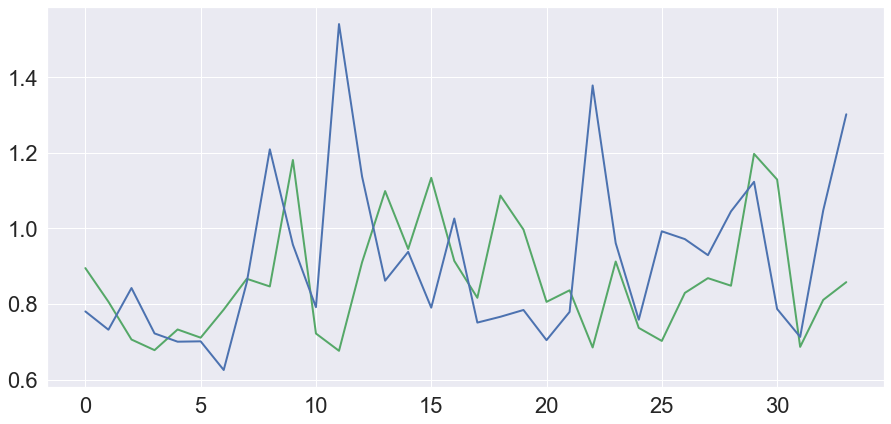

MAE: 0.187
MAPE :  0.18765843961788403


In [67]:
X, y = data[:, :-1], data[:, -1]
#X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.1)
#model = XGBRegressor(n_estimators=1000, learning_rate=0.1) => bad!! overfits to almost 100%
model = XGBRegressor()
model.fit(X_train, y_train)
prediction = model.predict(X_test)
plt.figure(figsize=(15, 7))
plt.plot(prediction, "g", label="prediction", linewidth=2.0)
plt.plot(y_test, label="actual", linewidth=2.0)
plt.show()

mae = mean_absolute_error(y_test, prediction)
print('MAE: %.3f' % mae)
mape = mean_absolute_percentage_error(y_test, prediction)
print('MAPE : ',mape)

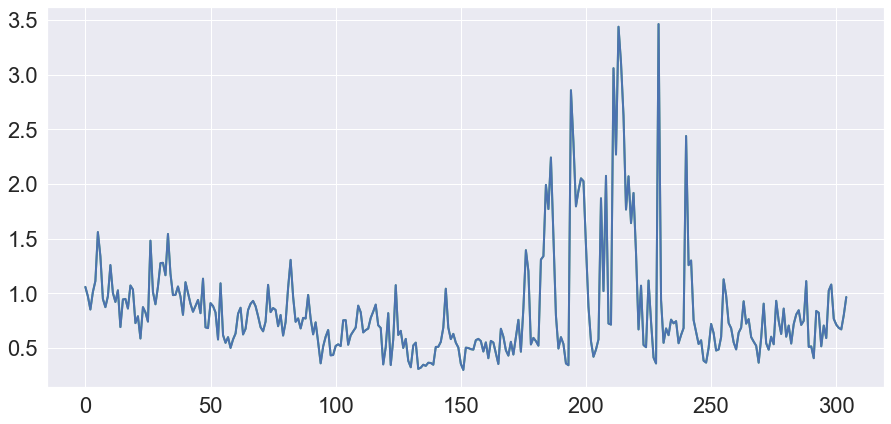

MAE: 0.001
MAPE :  0.0008677967201142536


In [69]:
# checking accuracy for training set
prediction = model.predict(X_train)
plt.figure(figsize=(15, 7))
plt.plot(prediction, "g", label="prediction", linewidth=2.0)
plt.plot(y_train, label="actual", linewidth=2.0)
plt.show()

mae = mean_absolute_error(y_train, prediction)
print('MAE: %.3f' % mae)
mape = mean_absolute_percentage_error(y_train, prediction)
print('MAPE : ',mape)

cross val split 1 train size:  274
cross val split 2 train size:  275
Split ---------------------------------------------------------------


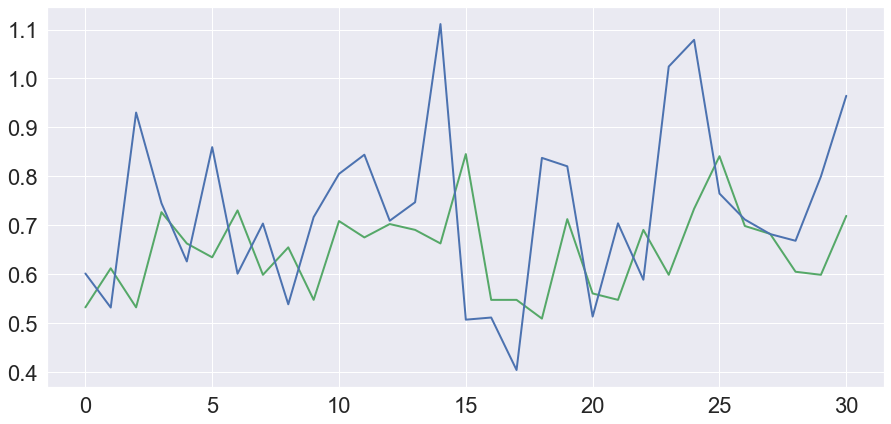

MAE: 0.153
MAPE :  0.20053265206580098
Split ---------------------------------------------------------------


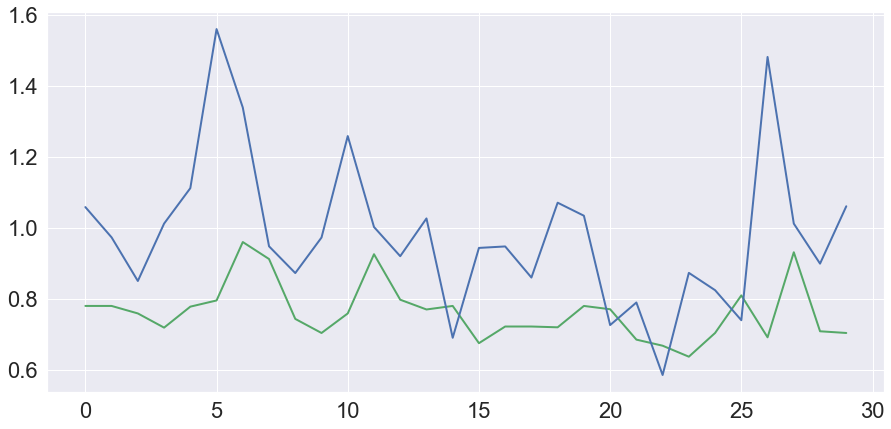

MAE: 0.238
MAPE :  0.2216354813586455
Mean MAPE :  0.21108406671222324


In [70]:
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.1)
splits = cross_val_split(X_train, y_train, test_size=0.1)
sum = 0
for split in splits:
    print('Split ---------------------------------------------------------------')
    X_train, X_test, y_train, y_test = split[0], split[1],split[2],split[3]
    model = XGBRegressor(n_estimators=60, learning_rate=0.02, max_depth=5)
    model.fit(X_train, y_train)
    prediction = model.predict(X_test)
    plt.figure(figsize=(15, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test, label="actual", linewidth=2.0)
    plt.show()

    mae = mean_absolute_error(y_test, prediction)
    print('MAE: %.3f' % mae)
    mape = mean_absolute_percentage_error(y_test, prediction)
    print('MAPE : ',mape)
    sum += mape

mean_mape = sum/2
print('Mean MAPE: ',mean_mape)

#### Observations :
XGBoost - as the training set accuracy/error increases (i.e., model complexity/overfitting is reduced), model does better on unseen data - by tweaking the 3 hyperparameters (keeping learning rate low and max_depth within 5 helps), test set error significantly reduces.

Best accuracy that could be achieved for 70% training, 30% test split :<br>
Training set MAPE - 0.1913494800008549 <br>
Test set MAPE - 0.19018122173986535

Hyperparameter values tried -<br>
n_estimators = 30, 50, 60, 100, 200, 1000<br>
learning_rate = 0.01, 0.02, 0.05, 0.1 <br>
max_depth = 3, 4, 5, 6

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


          ds      yhat  yhat_lower  yhat_upper
0 2016-01-01  0.965621    0.366404    1.516754
1 2016-01-02  0.979597    0.363915    1.587752
2 2016-01-03  0.952129    0.379114    1.540172
3 2016-01-04  1.150179    0.536895    1.772818
4 2016-01-05  0.896159    0.284147    1.511430


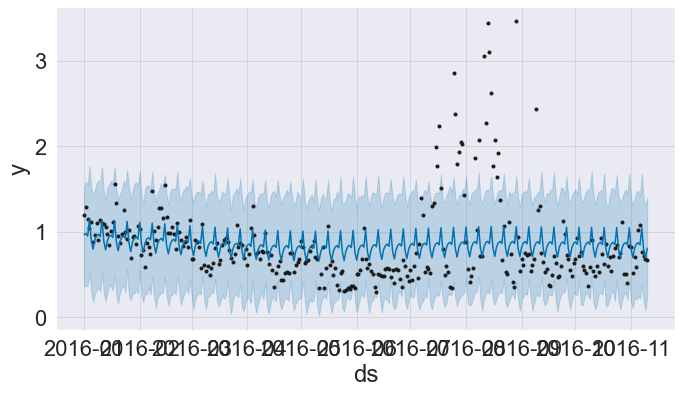

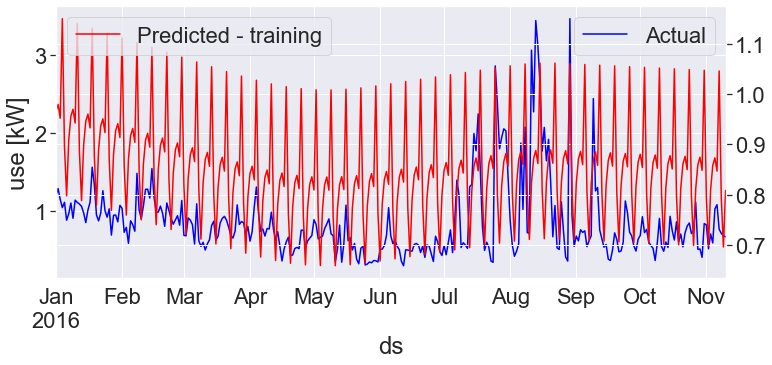

MAE for training set : 0.302
MAPE for training set :  0.3870361064500433
          ds      yhat  yhat_lower  yhat_upper
0 2016-11-11  0.856732    0.236812    1.462536
1 2016-11-12  0.871870    0.219006    1.474630
2 2016-11-13  0.845565    0.259754    1.436616
3 2016-11-14  1.044777    0.452391    1.680290
4 2016-11-15  0.791920    0.179038    1.401490


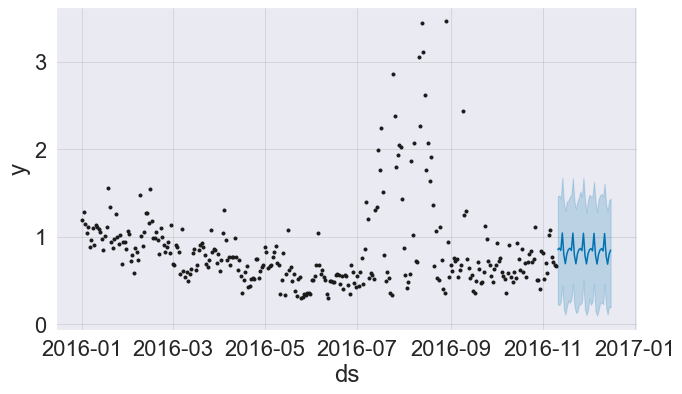

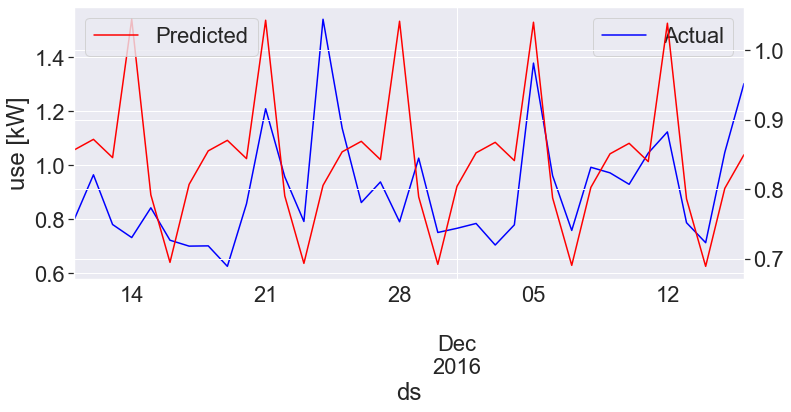

MAE for test set : 0.153
MAPE for test set :  0.1580564977660564


In [71]:
prophet_build_and_predict(0.9, daily_df)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


          ds      yhat  yhat_lower  yhat_upper
0 2016-01-01  1.054850    0.472052    1.609697
1 2016-01-02  1.058613    0.452660    1.621116
2 2016-01-03  1.011051    0.455400    1.565997
3 2016-01-04  1.273853    0.651099    1.898748
4 2016-01-05  0.964924    0.368872    1.564541


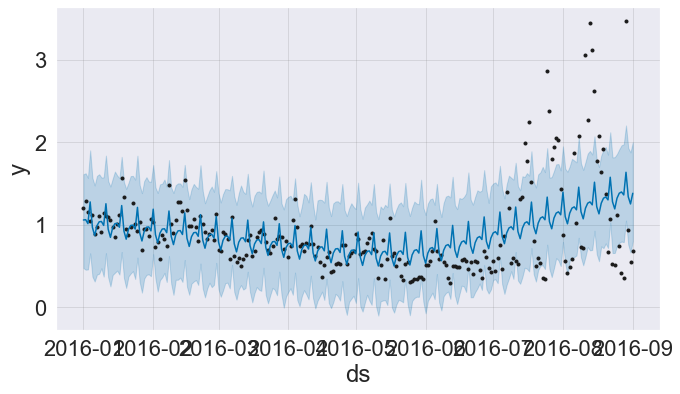

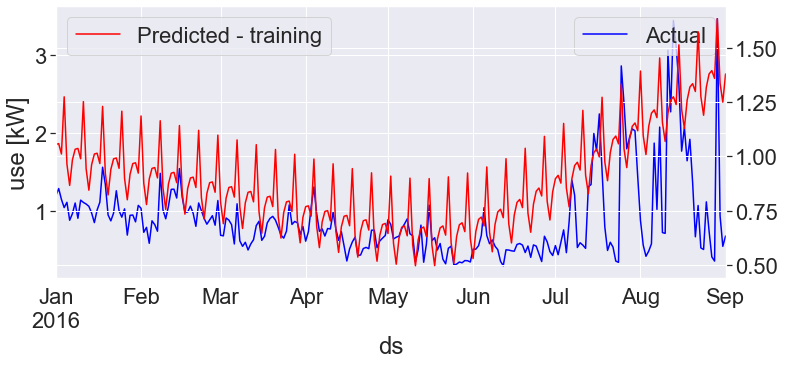

MAE for training set : 0.300
MAPE for training set :  0.38820683265432604
          ds      yhat  yhat_lower  yhat_upper
0 2016-09-02  1.439159    0.875903    2.038844
1 2016-09-03  1.454665    0.865739    1.996082
2 2016-09-04  1.418845    0.835828    2.003543
3 2016-09-05  1.693390    1.129991    2.273751
4 2016-09-06  1.396203    0.807699    1.991331


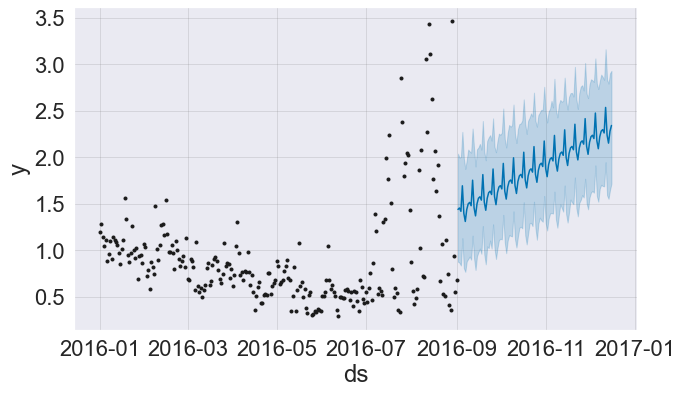

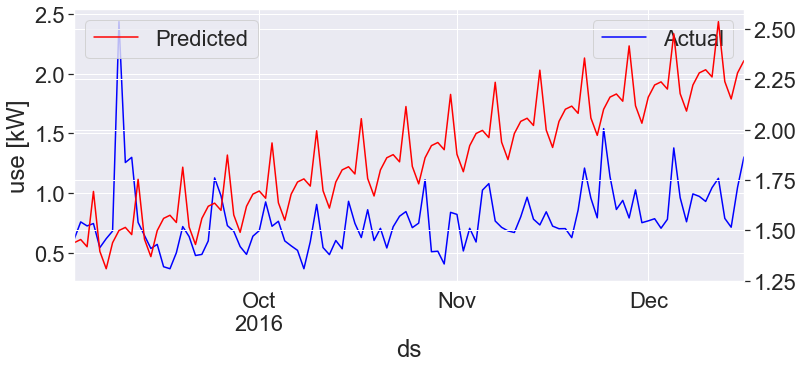

MAE for test set : 1.112
MAPE for test set :  1.5964141506342238


In [73]:
prophet_build_and_predict(0.7, daily_df)